In [1]:
import numpy as np # linear algebra

In [22]:
pip install pandas-profiling

Note: you may need to restart the kernel to use updated packages.Collecting pandas-profiling

  Created wheel for phik: filename=phik-0.11.2-py3-none-any.whl size=1107420 sha256=00d58add7a233d7e4c316b84f439bb3c7e62055c3d1d11418741f5459207eeb0
  Stored in directory: c:\users\jackline\appdata\local\pip\cache\wheels\72\9a\23\097c93fd8341220d92674891b6a9a30f0e389719d9b7291bd2
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27091 sha256=03b12b72527a7a338f54fe64fd3d2872b3a52151dc2634e3b05f2c39f7369d53
  Stored in directory: c:\users\jackline\appdata\local\pip\cache\wheels\23\14\6e\4be5bfeeb027f4939a01764b48edd5996acf574b0913fe5243
Successfully built phik htmlmin


In [23]:
import pandas as pd
import pandas as datareader
import pandas_profiling
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import recall_score, f1_score, precision_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier, RandomForestClassifier

In [13]:
df =pd.read_csv("C:/Users/Jackline/Desktop/Ass Data/2.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [24]:
pandas_profiling.ProfileReport(df)

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [26]:
cols = list(df.columns)
cols

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

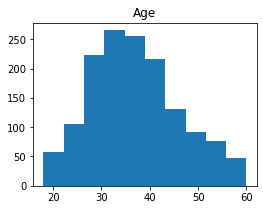

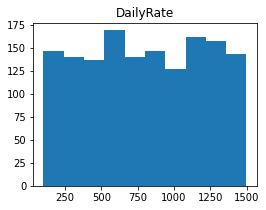

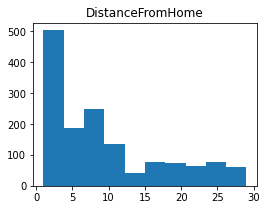

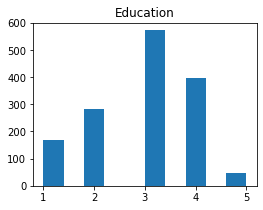

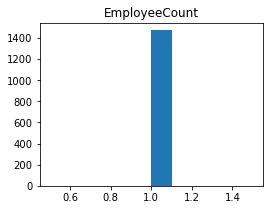

...

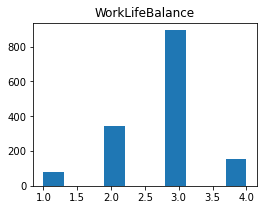

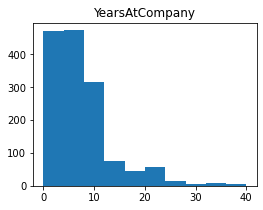

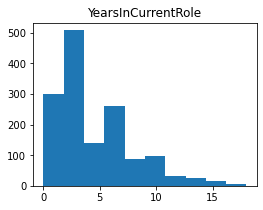

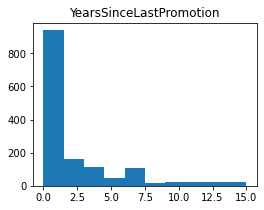

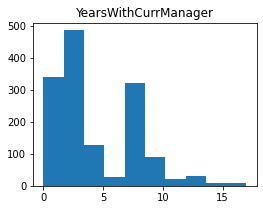

In [27]:
for col in cols:
    if df[col].dtype != 'int64':
        pass
    else:
        plt.figure(figsize=(4, 3))
        plt.hist(df[col])
        plt.title(col)
        plt.show()

In [34]:
df =pd.read_csv("C:/Users/Jackline/Desktop/Ass Data/2.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [35]:
drops = ['EmployeeCount', 'EmployeeNumber', 'StandardHours', 'Over18']
df = df.drop(columns=drops)

In [36]:
df.Attrition.value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [37]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,...,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,...,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,...,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,...,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,...,3,4,1,6,3,3,2,2,2,2


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [39]:
df.Attrition.replace({'Yes': 1, 'No': 0}, inplace=True)
df.Gender.replace({'Male': 1, 'Female': 0}, inplace=True)
df.MaritalStatus.replace({'Married': 2, 'Single': 1, 'Divorced': 0}, inplace=True)
df.OverTime.replace({'No': 0, 'Yes': 1}, inplace=True)

In [40]:
cats = ['BusinessTravel', 'Department', 'EducationField', 'JobRole', 'MaritalStatus']

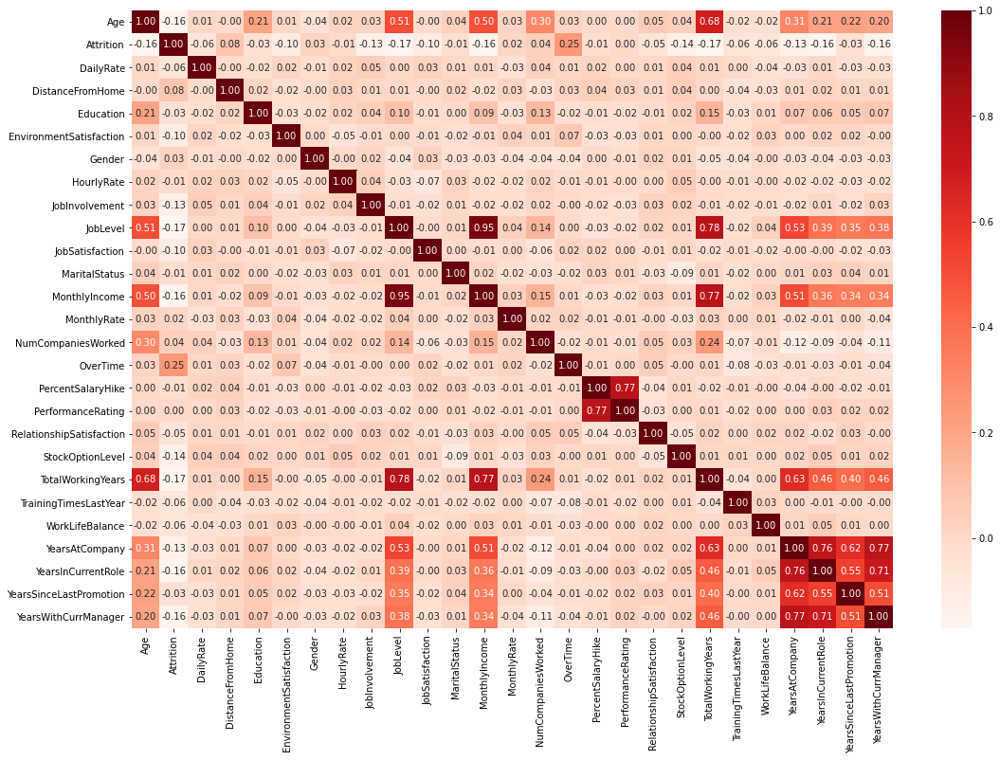

In [41]:
plt.figure(figsize=(18, 12))
sns.heatmap(df.corr(), cmap='Reds', annot=True, fmt='.2f');

In [42]:
corr = ['JobLevel', 'MonthlyIncome', 'PercentSalaryHike', 'YearsAtCompany', 'YearsInCurrentRole', 'Age']
df.drop(columns=corr, inplace=True)

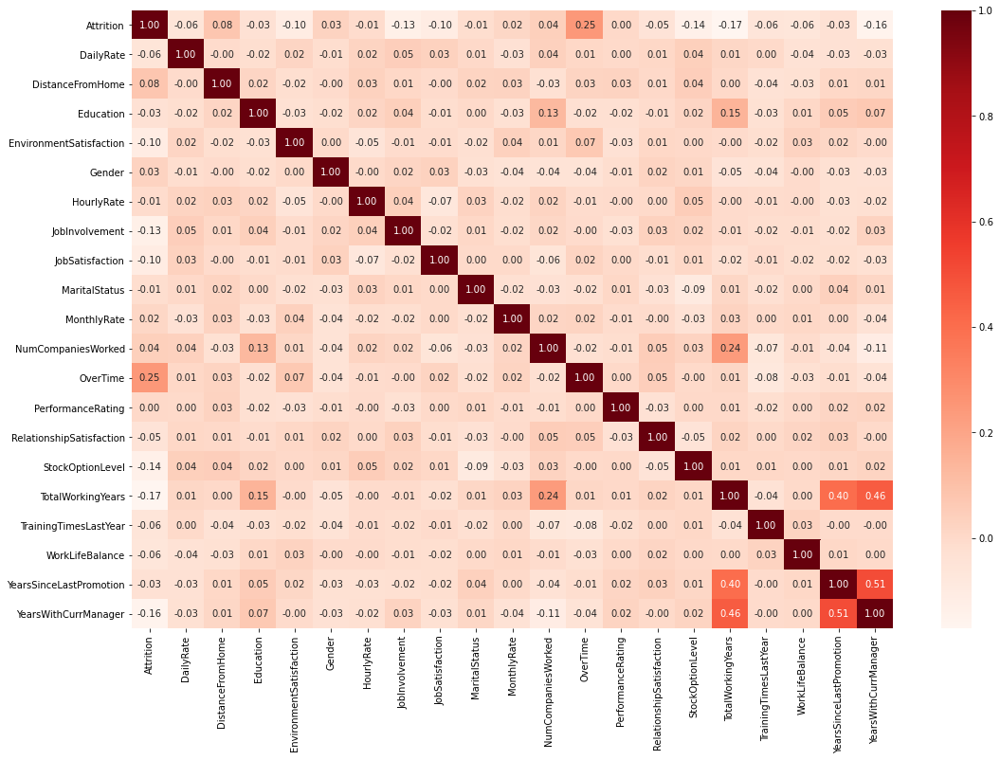

In [43]:
plt.figure(figsize=(18, 12))
sns.heatmap(df.corr(), cmap='Reds', annot=True, fmt='.2f');

In [44]:
df = pd.get_dummies(df)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 42 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Attrition                          1470 non-null   int64
 1   DailyRate                          1470 non-null   int64
 2   DistanceFromHome                   1470 non-null   int64
 3   Education                          1470 non-null   int64
 4   EnvironmentSatisfaction            1470 non-null   int64
 5   Gender                             1470 non-null   int64
 6   HourlyRate                         1470 non-null   int64
 7   JobInvolvement                     1470 non-null   int64
 8   JobSatisfaction                    1470 non-null   int64
 9   MaritalStatus                      1470 non-null   int64
 10  MonthlyRate                        1470 non-null   int64
 11  NumCompaniesWorked                 1470 non-null   int64
 12  OverTime            

In [45]:
df.head()

,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobSatisfaction,MaritalStatus,...,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,1,1102,1,2,2,0,94,3,4,1,...,0,0,0,0,0,0,0,0,1,0
1,0,279,8,1,3,1,61,2,2,2,...,0,0,0,0,0,0,0,1,0,0
2,1,1373,2,2,4,1,92,2,3,1,...,0,0,0,1,0,0,0,0,0,0
3,0,1392,3,4,4,0,56,3,3,2,...,0,0,0,0,0,0,0,1,0,0
4,0,591,2,1,1,1,40,3,2,2,...,0,0,0,1,0,0,0,0,0,0


<AxesSubplot:>

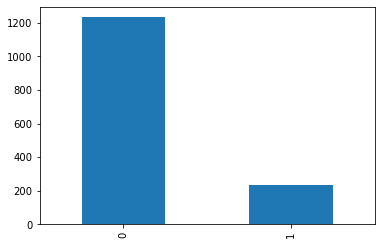

In [46]:


df.Attrition.value_counts().plot(kind="bar")



In [47]:
dtclf = DecisionTreeClassifier()
rfclf = RandomForestClassifier()
gbclf = GradientBoostingClassifier()
adaclf = AdaBoostClassifier()
bagclf = BaggingClassifier()

In [48]:
target = df.Attrition
features = df.drop(columns='Attrition')

In [49]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.25, random_state=25)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(1102, 41) (1102,)
(368, 41) (368,)


In [50]:
dtclf.fit(X_train, y_train)

DecisionTreeClassifier()

In [51]:
train_preds = dtclf.predict(X_train)

In [52]:
y_preds = dtclf.predict(X_test)

In [53]:
y_train.shape, y_preds.shape, y_test.shape, train_preds.shape

((1102,), (368,), (368,), (1102,))

In [54]:
print("Test Accuracy= ", accuracy_score(y_test, y_preds))
print()
print("Test Recall= ", recall_score(y_test, y_preds))
print()
print("Test Precision= ", precision_score(y_test, y_preds))
print()
print("F1-Score= ", f1_score(y_test, y_preds))

Test Accuracy=  0.7717391304347826

Test Recall=  0.2857142857142857

Test Precision=  0.26666666666666666

F1-Score=  0.2758620689655172


In [55]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.87      0.86      0.86       312
           1       0.27      0.29      0.28        56

    accuracy                           0.77       368
   macro avg       0.57      0.57      0.57       368
weighted avg       0.78      0.77      0.77       368



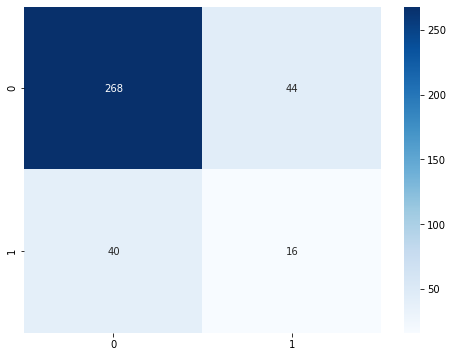

In [56]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_preds), cmap='Blues', annot=True, fmt='.16g');

In [60]:
rfclf.fit(X_train, y_train)


RandomForestClassifier()

In [61]:
y_preds = rfclf.predict(X_test)

In [62]:
print("Test Accuracy= ", accuracy_score(y_test, y_preds))
print()
print("Test Recall= ", recall_score(y_test, y_preds))
print()
print("Test Precision= ", precision_score(y_test, y_preds))
print()
print("F1-Score= ", f1_score(y_test, y_preds))

Test Accuracy=  0.8505434782608695

Test Recall=  0.07142857142857142

Test Precision=  0.5714285714285714

F1-Score=  0.12698412698412698


In [63]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.86      0.99      0.92       312
           1       0.57      0.07      0.13        56

    accuracy                           0.85       368
   macro avg       0.71      0.53      0.52       368
weighted avg       0.81      0.85      0.80       368



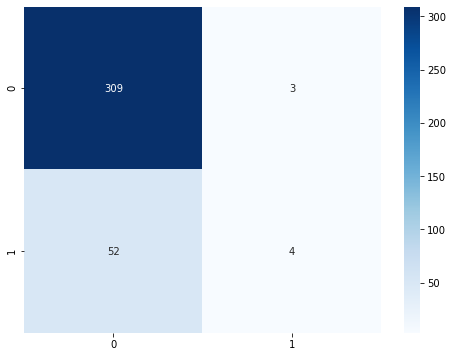

In [64]:


plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_preds), cmap='Blues', annot=True, fmt='.16g');



In [65]:


gbclf.fit(X_train, y_train)



GradientBoostingClassifier()

In [66]:
y_preds = gbclf.predict(X_test)

In [68]:
print("Test Accuracy= ", accuracy_score(y_test, y_preds))
print()
print("Test Recall= ", recall_score(y_test, y_preds))
print()
print("Test Precision= ", precision_score(y_test, y_preds))
print()
print("F1-Score= ", f1_score(y_test, y_preds))

Test Accuracy=  0.8586956521739131

Test Recall=  0.25

Test Precision=  0.5833333333333334

F1-Score=  0.35000000000000003


In [69]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.88      0.97      0.92       312
           1       0.58      0.25      0.35        56

    accuracy                           0.86       368
   macro avg       0.73      0.61      0.64       368
weighted avg       0.83      0.86      0.83       368



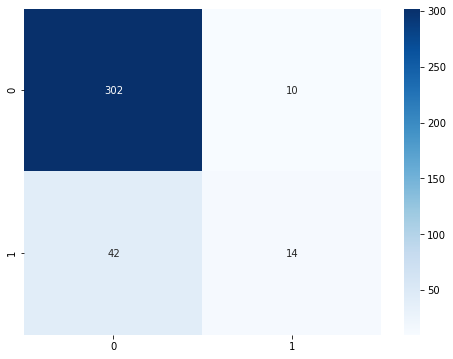

In [70]:


plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_preds), cmap='Blues', annot=True, fmt='.16g');



In [71]:
adaclf.fit(X_train, y_train)

AdaBoostClassifier()

In [72]:
y_preds = adaclf.predict(X_test)

In [73]:
print("Test Accuracy= ", accuracy_score(y_test, y_preds))
print()
print("Test Recall= ", recall_score(y_test, y_preds))
print()
print("Test Precision= ", precision_score(y_test, y_preds))
print()
print("F1-Score= ", f1_score(y_test, y_preds))

Test Accuracy=  0.8722826086956522

Test Recall=  0.35714285714285715

Test Precision=  0.6451612903225806

F1-Score=  0.4597701149425288


In [74]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.89      0.96      0.93       312
           1       0.65      0.36      0.46        56

    accuracy                           0.87       368
   macro avg       0.77      0.66      0.69       368
weighted avg       0.86      0.87      0.86       368



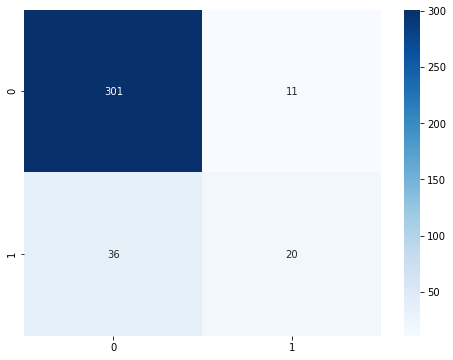

In [75]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_preds), cmap='Blues', annot=True, fmt='.16g');

In [76]:
bagclf.fit(X_train, y_train)

BaggingClassifier()

In [77]:
y_preds = bagclf.predict(X_test)

In [78]:
print("Test Accuracy= ", accuracy_score(y_test, y_preds))
print()
print("Test Recall= ", recall_score(y_test, y_preds))
print()
print("Test Precision= ", precision_score(y_test, y_preds))
print()
print("F1-Score= ", f1_score(y_test, y_preds))

Test Accuracy=  0.8315217391304348

Test Recall=  0.19642857142857142

Test Precision=  0.39285714285714285

F1-Score=  0.26190476190476186


In [79]:
print(classification_report(y_test, y_preds))

              precision    recall  f1-score   support

           0       0.87      0.95      0.90       312
           1       0.39      0.20      0.26        56

    accuracy                           0.83       368
   macro avg       0.63      0.57      0.58       368
weighted avg       0.80      0.83      0.81       368



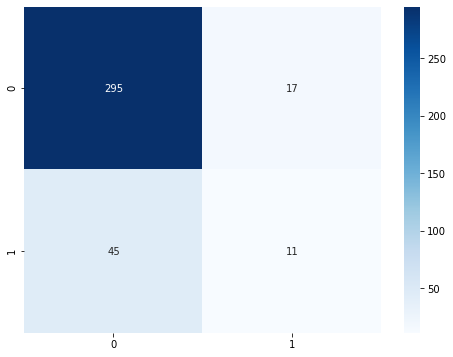

In [80]:
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(y_test, y_preds), cmap='Blues', annot=True, fmt='.16g');

In [81]:
df =pd.read_csv("C:/Users/Jackline/Desktop/Ass Data/2.csv")
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [82]:
drops = ['EmployeeCount', 'EmployeeNumber', 'StandardHours', 'Over18']
df = df.drop(columns=drops)

In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [84]:
objs = []
for column in list(df.columns):
    if df[column].dtype == 'object':
        print(column, "is an object")
        objs.append(column)

Attrition is an object
BusinessTravel is an object
Department is an object
EducationField is an object
Gender is an object
JobRole is an object
MaritalStatus is an object
OverTime is an object


In [85]:
for obj in objs:
    print(obj.upper())
    print(df[obj].value_counts())
    print()
    print('*' * 50)
    print()

ATTRITION
No     1233
Yes     237
Name: Attrition, dtype: int64

**************************************************

BUSINESSTRAVEL
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64

**************************************************

DEPARTMENT
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64

**************************************************

EDUCATIONFIELD
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64

**************************************************

GENDER
Male      882
Female    588
Name: Gender, dtype: int64

**************************************************

JOBROLE
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Repr